# Análisis de los resultados de las elecciones españolas del año 2016 respecto a la renta de los votantes por provincia

El objetivo de este trabajo ha sido analizar los resultados que se obtuvieron en las elecciones españolas celebradas en el año 2016. Para ello, se han utilizado los datos que cada partido obtuvo en dichas elecciones y se han juntado con datos de renta media de los votantes. De esta manera, el objetivo ha sido analizar si las personas dependiendo de la renta que perciben tienen una tendencia a votar a un determinado partido o a una determina ideología.

Las librerias que se han utilizado para la elavoración del trabajo han sido las siguientes:

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
import plotly.graph_objects as go
import re

En primer lugar, se han analizado los resultados de las elecciones, para después analizar los datos de la renta de los españolas por provincia. Finalmente, tras en análisis independiente de estos dos conceptos se han unido para intentar resolver la cuestión planteada.

## Elecciones España 2016: ¿Cuántos votos obtuvo cada partido? 

En esta sección del trabajo se han analizado los datos de las elecciones de 2016. De esta forma, conoceremos los votos que obtuvo cada partido a nivel nacional. Para ello, hemos utilizado los datos que proporciona el Ministerio del Interior.

## Limpieza datos elecciones 2016

Se ha realizado la siguiente función para obtener los datos del CSV del Ministerio del Interior y adecuarlos a un formato adecuado para la correcta realización el estudio.

In [2]:
votos = pd.read_csv('08021606.csv', index_col=False )

In [3]:
def get_cosas (x):
    foo = x['codigo_elecciones']
    tipo_eleccion = []
    ano_eleccion = []
    mes_eleccion = []
    num_vuelta = []
    codigo_comunidad = []
    codigo_ine = []
    codigo_distrito = []
    codigo_candidatura = []
    votos_obtenidos = []
    num_candidatos = []
    for i in range(len(foo)):
        tipo_eleccion.append(foo[i][:2])
        ano_eleccion.append(foo[i][2:6])
        mes_eleccion.append(foo[i][6:8])
        num_vuelta.append(foo[i][8:9])
        codigo_comunidad.append(foo[i][9:11])
        codigo_ine.append(foo[i][11:13])
        codigo_distrito.append(foo[i][13:14])
        codigo_candidatura.append(int(foo[i][14:20]))
        votos_obtenidos.append(int(foo[i][20:28]))
        num_candidatos.append(int(foo[i][28:33]))
    d = {'tipo_eleccion':tipo_eleccion,'ano_eleccion':ano_eleccion,'mes_eleccion':mes_eleccion,'num_vuelta':num_vuelta,
         'codigo_comunidad':codigo_comunidad,'codigo_ine':codigo_ine,'codigo_distrito':codigo_distrito, 
         'codigo_candidatura':codigo_candidatura, 'votos_obtenidos':votos_obtenidos,'num_candidatos': num_candidatos}
    datos_elecciones_2016 = pd.DataFrame(d)
    return datos_elecciones_2016

my_data = get_cosas(votos)
my_data = my_data.drop(columns = ['tipo_eleccion','ano_eleccion','mes_eleccion','num_vuelta',
                                 'codigo_distrito'])
my_data

fig = go.Figure(data=[go.Table(
                header = dict(values = ['Código Comunidad', 'Código INE', 'Código Candidatura', ' Votos Obtenidos', 'Número Candidatos'],
                              fill = dict(color = 'goldenrod'),
                             font = dict(size = 20, color = 'white')),
                cells = dict(values = [my_data.codigo_comunidad, my_data.codigo_ine, my_data.codigo_candidatura, my_data.votos_obtenidos, my_data.num_candidatos],
                            fill = dict(color = ['lemonchiffon','khaki','lemonchiffon','khaki','lemonchiffon'])))
                     ])
fig.show()

El código **99** representa los datos nacionales, se ha decidido basar nuestro análisis en datos provinciales por lo que generamos un filtro de esta forma.

In [4]:
my_data = my_data[(my_data['codigo_comunidad'] != '99')& (my_data['codigo_ine'] != '99')] 

Para obtener una mejor visualización de los datos se ha agregado la sigla y denominación de los partidos de acuerdo al código de la candidatura. 

In [5]:
codigo_candidatura = pd.read_csv('03021606.csv', index_col=False, encoding='UTF-8', 
                                 sep = ";", names = ['tipo_eleccion','ano','mes'
                                                     ,'codigo_candidatura','siglas',
                                                     'denominación'
                                                     ,'codigo_nacional','sigla_nacional'], header=0)
codigo_candidatura = codigo_candidatura.drop(columns = ['tipo_eleccion','ano','mes','codigo_nacional'])
codigo_candidatura

fig = go.Figure(data=[go.Table(
                header = dict(values = ['Código Candidatura', 'Siglas', 'Denominación', 'Sigla Nacional'],
                              fill = dict(color = 'goldenrod'),
                             font = dict(size = 20, color = 'white')),
                cells = dict(values = [my_data.codigo_candidatura, codigo_candidatura.siglas, codigo_candidatura.denominación, codigo_candidatura.sigla_nacional],
                            fill = dict(color = ['lemonchiffon','khaki','lemonchiffon','khaki'])))
                     ])
fig.show()

A continuación, se ha realizado la unión de todos los datos en una sola tabla.

In [6]:
merge_candidatura = my_data.merge(codigo_candidatura,on= 'codigo_candidatura')
merge_candidatura

fig = go.Figure(data=[go.Table(
                header = dict(values = ['Código Comunidad', 'Código INE', 'Código Candidatura', 'Votos Obtenidos', 'Número Candidatos', 'Siglas', 'Denominación', 'Sigla Nacional'],
                              fill = dict(color = 'goldenrod'),
                             font = dict(size = 14, color = 'white')),
                cells = dict(values = [my_data.codigo_comunidad,  my_data.codigo_ine, my_data.codigo_candidatura, my_data.votos_obtenidos, my_data.num_candidatos, codigo_candidatura.siglas, codigo_candidatura.denominación, codigo_candidatura.sigla_nacional],
                            fill = dict(color = ['lemonchiffon','khaki','lemonchiffon','khaki','lemonchiffon','khaki','lemonchiffon','khaki'])))
                     ])
fig.show()

## Añadiendo datos de población

Para contextualizar correctamente los datos de votos, y realizar una analisis más representativo se han obtenido los datos de la población española por provincia en el INE.

In [7]:
poblacion_provincia = pd.read_csv('poblacion_por_provincia.csv', index_col=False , skiprows = 5, sep = ";",encoding='iso-8859-1')
poblacion_provincia.rename(columns={'Unnamed: 0':'provincia','TOTAL':'num_poblacion_censada'},inplace=True)
poblacion_provincia.drop(poblacion_provincia.tail(3).index,inplace=True)
poblacion_provincia.drop(poblacion_provincia.head(1).index, inplace=True)
poblacion_provincia = poblacion_provincia.reset_index().drop(columns = ['index'])
poblacion_provincia

def get_cosas (x):
    foo = x['provincia']
    foo2 = x['num_poblacion_censada']
    codigo_ine = []
    nombre_provincia = []
    num_poblacion_censada = []
    for i in range(len(foo)):
        codigo_ine.append(foo[i][:2])
        nombre_provincia.append(foo[i][3:])
        num_poblacion_censada.append(int(foo2[i]))
    d = {'codigo_ine':codigo_ine,'nombre_provincia':nombre_provincia, 
         'num_poblacion_censada':num_poblacion_censada}
    datos_poblacion_2016 = pd.DataFrame(d)
    return datos_poblacion_2016

my_poblacion = get_cosas(poblacion_provincia)
my_poblacion.head(10)

,codigo_ine,nombre_provincia,num_poblacion_censada
0,02,Albacete,419678
1,03,Alicante/Alacant,901406
2,04,Almería,458175
3,01,Araba/Álava,176277
4,33,Asturias,860623
5,05,Ávila,217654
6,06,Badajoz,796267
7,07,"Balears, Illes",490426
8,08,Barcelona,3013092
9,48,Bizkaia,827545


Y se lo añadimos a traves de "codigo_ine".

In [8]:
merge_candidatura = merge_candidatura.merge(my_poblacion,on= 'codigo_ine')
merge_candidatura

fig = go.Figure(data=[go.Table(
                header = dict(values = ['Código Comunidad', 'Código INE', 'Código Candidatura', 'Votos Obtenidos', 'Número Candidatos', 'Siglas', 'Denominación', 'Sigla Nacional', 'Nombre Provincia', 'Número Población'],
                              fill = dict(color = 'goldenrod'),
                             font = dict(size = 11, color = 'white')),
                cells = dict(values = [my_data.codigo_comunidad,  my_data.codigo_ine, my_data.codigo_candidatura, my_data.votos_obtenidos, my_data.num_candidatos, codigo_candidatura.siglas, codigo_candidatura.denominación, codigo_candidatura.sigla_nacional, my_poblacion.nombre_provincia, my_poblacion.num_poblacion_censada],
                            fill = dict(color = ['lemonchiffon','khaki','lemonchiffon','khaki','lemonchiffon','khaki','lemonchiffon','khaki','lemonchiffon','khaki'])))
                     ])
fig.show()

## Sigla Nacional

Agrupamos nuestros datos por sigla nacional.

In [9]:
test = merge_candidatura.groupby(['sigla_nacional'], as_index = False).sum()
test

fig = go.Figure(data=[go.Table(
                header = dict(values = ['Sigla Nacional','Código Candidatura', 'Votos Obtenidos', 'Número Candidatos',  'Número Población'],
                              fill = dict(color = 'goldenrod'),
                             font = dict(size = 11, color = 'white')),
                cells = dict(values = [codigo_candidatura.sigla_nacional,my_data.codigo_candidatura, my_data.votos_obtenidos, my_data.num_candidatos, my_poblacion.num_poblacion_censada],
                            fill = dict(color = ['lemonchiffon','khaki','lemonchiffon','khaki','lemonchiffon'])))
                     ])
fig.show()

Ordenamos de mayor a menor de acuerdo a la cantidad de votos obtenidos. 

In [10]:
datos_order = test.sort_values(by=['votos_obtenidos'], ascending=False).reset_index()
datos_order

fig = go.Figure(data=[go.Table(
                header = dict(values = ['Índice','Sigla Nacional', 'Código Candidatura', 'Votos Obtenidos', 'Número Candidatos'],
                              fill = dict(color = 'goldenrod'),
                             font = dict(size = 11, color = 'white')),
                cells = dict(values = [datos_order.index, codigo_candidatura.sigla_nacional, my_data.codigo_candidatura, my_data.votos_obtenidos, my_data.num_candidatos],
                            fill = dict(color = ['lemonchiffon','khaki','lemonchiffon','khaki','lemonchiffon'])))
                     ])
fig.show()

## TOP 5 partidos con el mayor número de votos

In [11]:
grafica_top = datos_order.sort_values(by=['votos_obtenidos'], ascending=False)
grafica_top = datos_order.head(5)

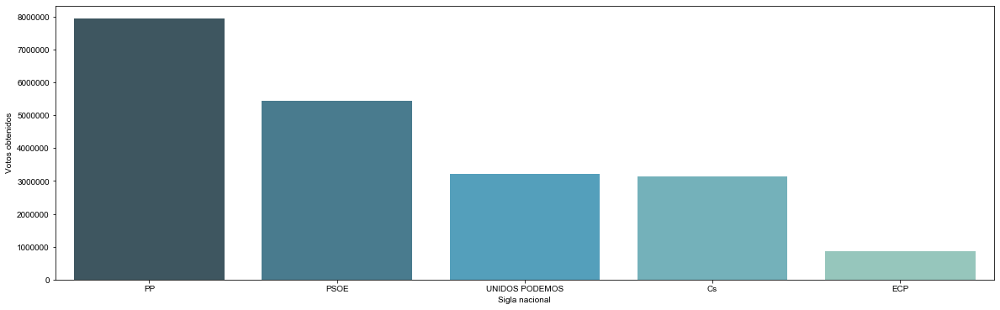

In [12]:
plt.figure(figsize=(20,6))
top = sns.barplot(x="sigla_nacional", y="votos_obtenidos", data=grafica_top,
             palette = "GnBu_d")
top=top.set(xlabel='Sigla nacional', ylabel='Votos obtenidos')
top=sns.set(font_scale=1.5)
top

De acuerdo al análisis realizado, observamos que el partido que más votos obtuvo en las elecciones de congreso en 2016 fue el partido **Partido Popular - PP** obteniendo un total de 7.941.236 millones de votos a nivel nacional. 

El segundo partido en obtener la mayor cantidad de votos fue **Partido Socialista Obrero Español - PSOE** con un total de **5.443.846** millones de votos a nivel nacional.

## Top 5 partidos con el menor número de votos

In [13]:
grafica_low = datos_order.tail(5)

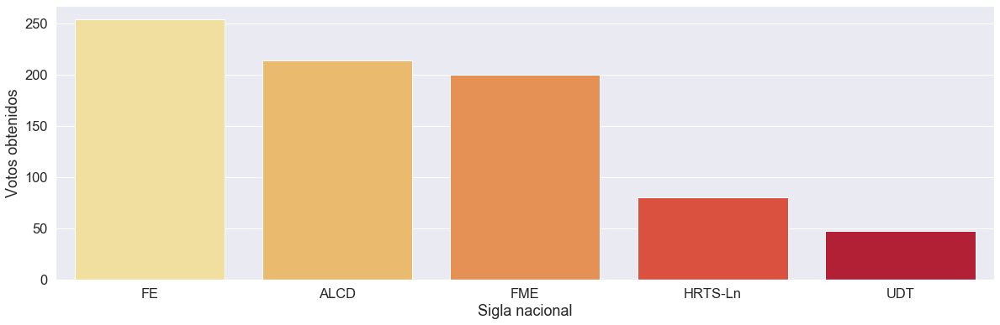

In [14]:
plt.figure(figsize=(20,6))
low = sns.barplot(x="sigla_nacional", y="votos_obtenidos", data=grafica_low,
             palette="YlOrRd")
low=low.set(xlabel='Sigla nacional', ylabel='Votos obtenidos')
low=sns.set(font_scale=1.5)
low

Por otro lado podemos observar que el partido que obtuvo la menor cantidad de votos en las elecciones de 2016 a  fue **Unión de Todos** con un total de **48** votos.


# Enriqueciendo datos. Añadimos la renta por persona promedio

Nuestro pobjetivo es tratar de relacionar cómo se han distribuido los votos de las elecciones generales respecto a la renta media de las provincias de los españoles. Para ello, hemos añadido los datos de la renta promedio por persona por cada secciónes de población.

Los datos los hemos obtenido de la página del Instituto Nacional de Estadística [INE](https://www.ine.es/welcome.shtml). Hemos decidido descargar los datos con la definición máxima posible, por secciones. El formato de la descarga ha sido en CSV, separado por ";", con decimales "," y los millares ".".

A continuación mostramos la función diseñada para cargar los CSV y generar el dataframe de trabajo:


In [15]:
bbdd = ["Alava","Albacete","Alicante","Almeria","Asturias","Avila","Badajoz","Barcelona",
        "Bizkaia","Burgos","Caceres","Cadiz","Cantabria","Islas Baleares","Castellon","Ceuta","Ciudad Real",
        "Cordoba","Coruña","Cuenca","Gipuzkoa","Girona","Granada","Guadalajara","Huelva","Huesca","Jaen","La Rioja",
        "Las Palmas","Leon","LLeida","Lugo","Madrid","Malaga","Melilla","Murcia","Navarra","Ourense","Palencia","Pontevedra",
        "Salamanca","Santa Cruz de Tenerife","Segovia","Sevilla","Soria","Tarragona","Teruel","Toledo","Valencia",
        "Valladolid","Zamora","Zaragoza"]

def get_BBDD_rentas (bbdd):
    base = []
    INE = []
    INE_provincia = []
    renta = []
    poblacion = []
    provincias = []
    for i in bbdd:
        provincia = i
        datos = pd.read_csv('datos_renta/'+i+'.csv', index_col=False,encoding='iso-8859-1'
                            ,sep=';',skiprows=5, decimal= ',',thousands='.')
        datos.rename(columns={'Unnamed: 0':'identificador','2016':'renta'},inplace=True)
        datos.drop(datos.tail(3).index,inplace=True)
        for i in range(len(datos.identificador)):
            provincias.append(provincia)
        for i in range(len(datos.identificador)):
            INE_value = re.findall("[0-9]+", datos.identificador[i])[0]
            INE.append(INE_value)
        for i in range(len(datos.identificador)):
            INE_provincia_value = re.findall("[0-9]+", datos.identificador[i])[0][:2]
            INE_provincia.append(INE_provincia_value) 
        for i in range(len(datos.identificador)):
             nombre = re.findall("[a-zA-Záéíóúñ\\- /]+", datos.identificador[i])[0]
             nombre = re.sub(" sección","",nombre)
             nombre = re.sub(" secci","",nombre)
             nombre = re.sub("^ ","",nombre)
             nombre = re.sub(" $","",nombre)
             poblacion.append(nombre)
        for i in range(len(datos.identificador)):
            if datos.renta[i] == '.':
                datos.renta[i] = float('NaN')
            if isinstance(datos.renta[i],str) == True:
                renta_value = float(re.sub("\\.","",datos.renta[i]))
                renta.append(renta_value)
            else:
                renta_value = float(datos.renta[i])
                renta.append(renta_value)
    d = {'provincia':provincias,'poblacion':poblacion,'INE':INE,'codigo_ine':INE_provincia,'renta':renta}
    datos = pd.DataFrame(d)
    return datos

basedatos = get_BBDD_rentas(bbdd)
basedatos.head()

fig = go.Figure(data=[go.Table(
                header = dict(values = ['Provincia', 'Población', 'INE', 'Renta'],
                              fill = dict(color = 'goldenrod'),
                             font = dict(size = 20, color = 'white')),
                cells = dict(values = [basedatos.provincia, basedatos.poblacion, basedatos.INE, basedatos.renta],
                            fill = dict(color = ['lemonchiffon','khaki','lemonchiffon','khaki'])))
                     ])
fig.show()

## Funcionamiento de get_BBDD_rentas
La función descrita más arriba es el resultado de usar la táctica "Divide y vencerás". Se hizo una primera limpieza para sólo un CSV y después se contruyó una función que lo hiciese para todos los CSV. De todas formas, ha sido una tarea complicada ya que el formato no es uniforme en todos los CSV del INE.

A la función sólamente debemos de pasarle una lista de las provincias de las que se quiere realizar la carga de datos. En nuestro caso, son todas los existentes, un CSV por provincia. Generamos listas vacías para acumular los datos con el formato deseado y entramos en el loop principal que recorrerá la lista insertada e irá cargando todos los ficheros.

Una vez están los ficheros cargados se almacena en ```datos```. Los datos obtenidos son muy crudos; dos columnas, una con la renta y otro con una descripción donde se incluye la población, el codigo INE y la sección. Para subsanar esta "aglomeración" de datos, se ha preparado un loop por cada valor a incluir en el dataframe final; ```provincia ```,```poblacion ```,```INE ``` y ```renta ```.

### Limpieza y formateo de los datos cargados

#### Provincia
Aprovechando que el loop principal ya está usando el nombre de la provincia, se crea un loop para generar una lista de longitud el dataframe final y con el nombre de la provincia repetido tantas veces como filas de datos tenga la provincia cargada.

#### INE
Usando ```regex``` obtenemos todos los números de la columna "identificado"´de los CSV cargados, que no es más que la descripción que queremos limpiar.

#### Poblacion
Volviendo a usar ```regex``` pero esta vez con algo más de contundencia. Primero obtenemos todos los caracteres que hemos observado que aparecen como parte del nombre de la población para seguidamente quitarle tanto "sección" como "secci" (en algunos CSV sección aparecía como secci). Finalmente retiramos los posibles espacios que existan tanto al inicio como al fin del nombre.

#### Renta
Aparentemente la más sencilla, pero analizando bien los datos hemos comprobado que no todos siguen los mismos criterios. Existen valores vacíos, valores con un "." como valor y otros que efectivamente son dato. Hemos usado otra condición más porque en el CSV de Teruel incluyeron renta (que son valores enteros) con un ".0" al final de cada valor.

### Generación del data frame
Una vez listados todos los datos formateados en sus correspondientes listas vacías, generamos un diccionario con dichas listas y usando la funcion pd.DataFrame generamos el DF "datos".

## Impresión de tabla
Para mostrar los datos del dataframe ```basedatos``` hemos decidido usar la librería ```plotly```. Esta librería tiene muchas opciones de personalización de una forma muy sencilla. Como añadido, posibilitamos que se pueda hacer un prefiltro (```basedatos``` tiene más de 36.000 filas).

### Prefiltro
De una forma sencilla, posibilitamos que se pueda filtrar por provincia, población o código INE. Se selecciona una de las tres opciones y se indica el valor por el cual filtrar.
(p.e.: pruebe a introducir filtro por población ```2``` y filtre por ```Oleiros```).

Otra opción contemplada es que introduzca cualquier otro valor diferente a los descritos para que se muestre toda la tabla, ordenada por renta de mayor a menor.

### Generación de la tabla
Basicamente la función ```Table``` de la librería ```plotly.graph_objects``` permite personalizar el formato de la tabla de un DataFrame de pandas. En nuestro caso hemos modificado el encabezado ( a través de ```header```) y las celdas (a través de ```cell```). 

Se ha decidido cambiar el color tanto del encabezado como de las celdas. En las celdas en concreto se han puesto colores para las columnas pares y otros para los impares para facilitar la lectura de la tabla. De la misma forma, en el encabezado se ha modificado el tamaño y aspecto de la fuente.


In [16]:
basedatos_tabla = basedatos.sort_values('renta', ascending=False)
print("Para facilitar la visualización de la tabla vamos a realizar unos filtros:")
print("Filtro por provincia, insertar 1")
print("Filtro por poblacion, insertar 2")
print("Filtro por código INE, insertar 3")
print("Si quiere visualizar toda la tabla, introduzca cualquier otro valor")
seleccion = input()
if seleccion == "1":
    print("A continuación se muestran las provincias disponibles:")
    print(basedatos_tabla.provincia.unique())
    print("Introduzca el nombre de la provincia:")
    provincia_selected = input()
    basedatos_tabla = basedatos_tabla[basedatos_tabla['provincia'] == provincia_selected]
elif seleccion == "2":
    print("A continuación se muestran las poblaciones disponibles:")
    print(basedatos_tabla.poblacion.unique())
    print("Introduzca el nombre de la poblacion:")
    poblacion_selected = input()
    basedatos_tabla = basedatos_tabla[basedatos_tabla['poblacion'] == poblacion_selected]
elif seleccion == "3":
    print("Introduzca el código INE:")
    INE_selected = input()
    basedatos_tabla = basedatos_tabla[basedatos_tabla['INE'] == INE_selected]
else:
    print("Se imprimirá toda la tabla")

fig = go.Figure(data=[go.Table(
                header = dict(values = ['Provincia','Población','INE','<b>Renta(€)</b>'],
                              fill = dict(color = 'goldenrod'),
                             font = dict(size = 20, color = 'white')),
                cells = dict(values = [basedatos_tabla.provincia, basedatos_tabla.poblacion,
                                      basedatos_tabla.INE,
                                      basedatos_tabla.renta],
                            fill = dict(color = ['lemonchiffon','khaki','lemonchiffon','khaki'])))
                     ])
fig.show()

Para facilitar la visualización de la tabla vamos a realizar unos filtros:
Filtro por provincia, insertar 1
Filtro por poblacion, insertar 2
Filtro por código INE, insertar 3
Si quiere visualizar toda la tabla, introduzca cualquier otro valor
2
A continuación se muestran las poblaciones disponibles:
['Madrid' 'Barcelona' 'Pozuelo de Alarc' ... 'Villarroya del Campo'
 'Vilue' 'Vistabella']
Introduzca el nombre de la poblacion:
Ourense


A continuación, y para terminar con el análisis de la renta unilateralmente, se ha realizado un gráfico para representar la renta media de cada provincia y poder ver la brecha salarial que existe entre las provincias de España. Para ello, se ha utilizado la renta media de cada provincia y el gráfico utilizado ha sido un gráfico de barras.

In [17]:
datos_renta = basedatos.groupby('provincia', as_index =False ).renta.mean()
datos_renta = datos_renta.sort_values('renta',ascending=False)
datos_renta

fig = go.Figure(data=[go.Table(
                header = dict(values = ['Provincia', 'Renta'],
                              fill = dict(color = 'goldenrod'),
                             font = dict(size = 20, color = 'white')),
                cells = dict(values = [basedatos.provincia, basedatos.renta],
                            fill = dict(color = ['lemonchiffon','khaki'])))
                     ])
fig.show()

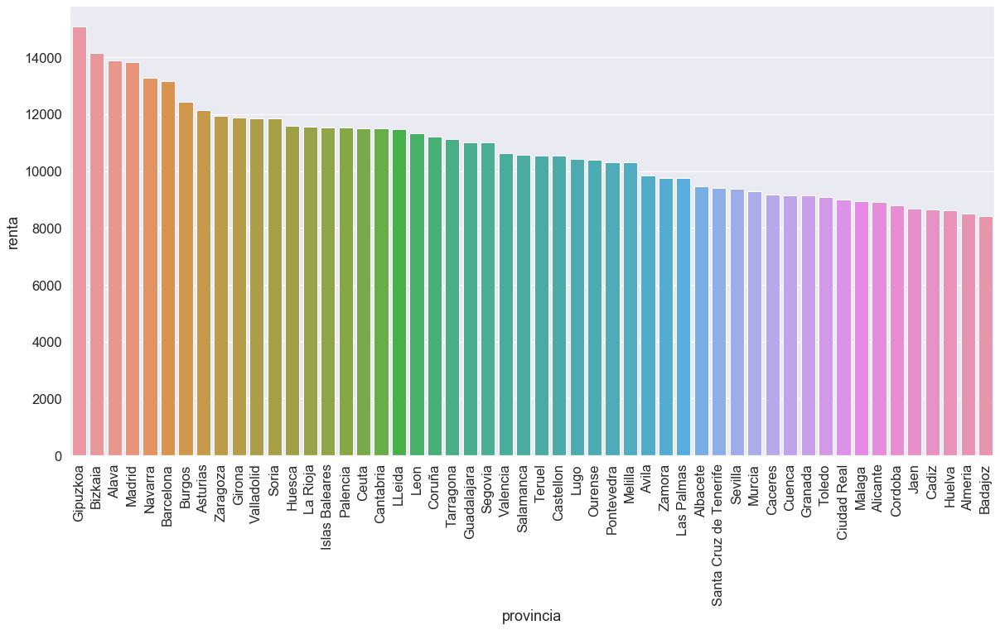

In [18]:
plt.figure(figsize=(20,10))
out = sns.barplot(x='provincia', y= 'renta',data=datos_renta)
out =out.set_xticklabels(out.get_xticklabels(), rotation=90)
out =sns.set(font_scale=2)
out

Como se puede observar en el gráfico las tres provincias con la renta media más alta son Guipúzcoa, Vizcaya y Álava. De lo contrario, las provincias con la renta media más baja son Huelva Almería y Badajoz.

## Incorporación de renta a datos electorales

Una vez explorados los datos de la tabla y comprobar que se han importado correctamente, se han incorporado los datos electorales para sacar posibles conclusiones en caso de que exista algún tipo de correlación. Para ello, se ha realizado un Group By.

In [19]:
test_ = basedatos.groupby(['codigo_ine','provincia'], as_index = False).mean()
test_.head(5)

,codigo_ine,provincia,renta
0,01,Alava,13891.549020
1,02,Albacete,9450.120401
2,03,Alicante,8919.547439
3,04,Almeria,8494.320261
4,05,Avila,9839.780269


Nos hemos quedado con las columnas más relevantes para nuestro estudio. Realizando una agrupación por ```código_ine``` y ```provincia``` y aplicando la función ```mean()``` obtenemos la renta media por provincia, el nombre de la provincia y el código INE de dicha provincia, dato clave para poder hacer un "join" correctamente.

Como los datos de ```renta``` por si solos no me aportan mucha información, hemos creido oportuno realizar un clasificador de rentas en función de los cuartiles de la columna. A continuación se muestran los umbrales, siendo:
 * De ```muy_baja``` a ```baja``` lo consideraremos como __baja__.
 * De ```baja``` a ```media``` lo consideraremos como __media__.
 * De ```media``` a ```alta``` lo consideraremos como __alta__.
 * De ```alta``` a ```muy_alta``` lo consideraremos como __muy alta__.

In [20]:
cuartiles = test_.quantile([0,0.25,0.5,0.75,1])
cuartiles['clasificacion_renta'] = ['muy_baja','baja','media','alta','muy_alta']
cuartiles # BONITA

,renta,clasificacion_renta
0.00,8408.840909,muy_baja
0.25,9264.635264,baja
0.50,10547.762818,media
0.75,11556.572041,alta
1.00,15063.744015,muy_alta


A continuación, se añade la clasificación realizada a la table que contiene los datos de renta media de cada provincia.

In [21]:
clasificacion_test = []
for i in range(len(test_)):
    renta_provincia = test_.renta[i]
    if renta_provincia < cuartiles.renta[0.25]:
        clasificacion_test.append(cuartiles.clasificacion_renta[0.25])
    elif renta_provincia < cuartiles.renta[0.5]:
        clasificacion_test.append(cuartiles.clasificacion_renta[0.5])
    elif renta_provincia < cuartiles.renta[0.75]:
        clasificacion_test.append(cuartiles.clasificacion_renta[0.75])
    else:
        clasificacion_test.append(cuartiles.clasificacion_renta[1.00])
test_['clasificacion_renta'] = clasificacion_test
test_.head(5) # BONITA

,codigo_ine,provincia,renta,clasificacion_renta
0,01,Alava,13891.549020,muy_alta
1,02,Albacete,9450.120401,media
2,03,Alicante,8919.547439,baja
3,04,Almeria,8494.320261,baja
4,05,Avila,9839.780269,media


Una vez tenemos esta clasificación, nos toca añadirlo a nuestra tabla de votos de las elecciones generales ```merge_candidatura_renta``` usando ```codigo_ine```. Para ello, volvemos a los datos de las elecciones:

In [22]:
merge_candidatura_renta = merge_candidatura.merge(test_,on= 'codigo_ine')

El número de votos no nos dice mucho acerca del resultado de un partido en esa provincia. En consecuencia, usando ```votos_obtenidos``` y ```num_poblacion_censada``` vamos a obtener el porcentaje de votos que una formación ha obtenido por provincia, denominando a esta nueva columna ```porc_votacion```.

Finalmente, eliminamos las columnas que no son necesarias para continuar con el análisis quedandonos únicamente con las columnas que nos van a ser de utilidad.

In [23]:
merge_candidatura_renta['porc_votacion'] = (merge_candidatura_renta['votos_obtenidos'] / merge_candidatura_renta['num_poblacion_censada'])*100
merge_candidatura_renta = merge_candidatura_renta.drop(columns= ['codigo_comunidad','codigo_ine','codigo_candidatura',
                                      'votos_obtenidos','num_candidatos','siglas',
                                       'denominación','nombre_provincia','num_poblacion_censada',
                                      'renta'])
merge_candidatura_renta # BONITA

              sigla_nacional provincia clasificacion_renta  porc_votacion
0                       PCPE     Cadiz                baja       0.074178
1                FE de las J     Cadiz                baja       0.045648
2                        VOX     Cadiz                baja       0.121180
3  RECORTES CERO-GRUPO VERDE     Cadiz                baja       0.137040
4                      P-LIB     Cadiz                baja       0.038008
                sigla_nacional provincia clasificacion_renta  porc_votacion
540                         PP   Ourense               media      27.902776
541                      PACMA   Ourense               media       0.503847
542  PODEMOS-EN MAREA-ANOVA-EU   Ourense               media       8.785218
543                       PSOE   Ourense               media      13.094908
544                       PCPE   Ourense               media       0.065732


,sigla_nacional,provincia,clasificacion_renta,porc_votacion
0,PCPE,Cadiz,baja,0.074178
1,FE de las J,Cadiz,baja,0.045648
2,VOX,Cadiz,baja,0.121180
3,RECORTES CERO-GRUPO VERDE,Cadiz,baja,0.137040
4,P-LIB,Cadiz,baja,0.038008
...,...,...,...,...
540,PP,Ourense,media,27.902776
541,PACMA,Ourense,media,0.503847
542,PODEMOS-EN MAREA-ANOVA-EU,Ourense,media,8.785218
543,PSOE,Ourense,media,13.094908


Finalmente, tenemos una tabla muy útil. Por provincia, nos indica los partidos que se han votado, la renta media y el porcentaje de votación respecto a su población censada. Ahora con esto vamos a tratar de responder a las siguientes preguntas:
* Primera pregunta: _¿Existe alguna relación entre renta y partidos que se votan?_
* Segunda pregunta: _¿La renta correlaciona con los porcentajes de votos? es decir ¿En provincias con mayor renta se concentran más lo votos?¿O es al revés?_

Para responder a estas preguntas, vamos a filtrar por el partido más votado por provincia. Generamos un bucle que recorre las provincias (hemos usado las de ```test_``` por comodidad) y va obteniendo los partidos más votados por cada ```i```, es decir, por cada provincia.

In [24]:
provincia = []
partido_ganador = []
renta = []
share = []
for i in test_.provincia:
    provincia.append(i)
    foo = merge_candidatura_renta[merge_candidatura_renta['provincia'] == i]
    foo = foo[foo['porc_votacion'] == foo['porc_votacion'].max()]
    foo2 = foo['sigla_nacional'].iloc[0]
    partido_ganador.append(foo2)
    foo3 = foo['clasificacion_renta'].iloc[0]
    renta.append(foo3)
    foo4 = foo['porc_votacion'].iloc[0]
    share.append(foo4)
d = {'provincia':provincia,'partido_ganador':partido_ganador,'renta':renta,'porc_votos':share}
tabla = pd.DataFrame(d)
tabla = tabla.sort_values('renta')
# Dividimos las tabla generada por rentas y mostramos los partidos que dichas provincias 
# han votado.
tabla_muy_alta = tabla[tabla['renta'] == "muy_alta"]
print(tabla_muy_alta.partido_ganador.unique())
print("Las rentas más altas votaron a 5 partidos diferentes.")

tabla_alta = tabla[tabla['renta'] == "alta"]
print(tabla_alta.partido_ganador.unique())
print("Las rentas altas votaron a 3 partidos diferentes.")

tabla_media = tabla[tabla['renta'] == "media"]
tabla_media.partido_ganador.count()
print(tabla_media.partido_ganador.unique())
print("Las rentas medias votaron a 2 partidos diferentes.")

tabla_baja = tabla[tabla['renta'] == "baja"]
print(tabla_baja.partido_ganador.unique())
print("Las rentas más altas votaron a 2 partidos diferentes.")

tabla.sort_values('porc_votos', ascending = False) # BONITA

['PP' 'UNIDOS PODEMOS' 'ERC-CATSÍ' 'ECP']
Las rentas más altas votaron a 5 partidos diferentes.
['PP' 'ERC-CATSÍ' 'ECP']
Las rentas altas votaron a 3 partidos diferentes.
['PSOE' 'PP']
Las rentas medias votaron a 2 partidos diferentes.
['PP' 'PSOE']
Las rentas más altas votaron a 2 partidos diferentes.


,provincia,partido_ganador,renta,porc_votos
27,Madrid,PP,muy_alta,41.199161
2,Alicante,PP,baja,36.568206
29,Murcia,PP,media,33.685959
11,Castellon,PP,media,33.301097
6,Islas Baleares,PP,alta,33.245586
25,La Rioja,PP,alta,32.573802
46,Valladolid,PP,muy_alta,31.566288
38,Cantabria,PP,alta,31.417685
18,Guadalajara,PP,alta,31.310798
45,Valencia,PP,alta,31.057960


### Primera pregunta:
Bueno, pues los datos la verdad es que no nos dicen mucho. En la primera pregunta formulada vemos que tampoco hay una correlación fuerte entre renta y partido a votar. Podría haber sido nuestra hipótesis que donde hay mayor renta se votaría con mas fuerza a partidos de la derecha (PP), pero por el contrario vemos que se han votado a 5 formaciones diferentes.

Lo que si vemos es una tendencia a que a mayor renta, más diversidad política. Interpretando este resultado, puede que esta tendencia se deba a que en aquellas provincias donde la renta es mayor, sus habitantes tienen mayor conocimiento y cultura (tristemente cuanto más dinero, vamos a tener mayores opciones de formación y desarrollo de hobbies y otros intereses) y este mayor conocimiento precipita en unas inquietudes políticas más diversas.

### Segunda pregunta:
Pues podemos concluir que la renta no tiene niguna relación con cuanto más se vota a un partido. Es decir, que la diversidad política de las provincias no depende de este factor, ya que en la tabla podemos ver como tanto si tienes renta muy alta o baja, hay resultados con bajo porcentaje de votos y a la vez alto porcentaje de votos.

## Plot resumen de votaciones

Para finalizar, es interesante ver cómo han votado por provincia a los partidos más votados:
* Partido Popular (PP).
* Partido Socialista Obrero Español (PSOE).
* Unidos Podemos.
* Ciudadanos (Cs).
* En Comú Podem (ECP)

Para ello es interesante pivotar la tabla principal ```merge_candidatura_renta```. De esta forma podremos ver los porcentajes de votos de todos los partidos por provincia. Obviamente, nos van a generar muchos "Nan" porque no todos los partidos presentan candidatura en todas las provincias.

Usando ```pivot_table``` podemos conseguir esta distribución indicando en ```index``` las filas que deseamos ver, en nuestro caso, renta y provincia, en ```columns``` las siglas de las formaciones presentadas y como ```values``` el porcentaje de votación obtenido.

In [25]:
# Grafica de barras por provincia vs porcentajevoto color respresenta clasificación renta
merge_candidatura_renta_pivot = merge_candidatura_renta.pivot_table(
                                index = ['provincia','clasificacion_renta'],
                                columns = 'sigla_nacional',
                                values = 'porc_votacion')

In [26]:
merge_candidatura_renta_pivot = merge_candidatura_renta_pivot.reset_index()

merge_candidatura_renta_pivot # BONITA

sigla_nacional,provincia,clasificacion_renta,ALCD,AND,BNG-NÓS,CCD,CCD-CI,CCa-PNC,CDC,CENTRO MODERADO,...,REPO,SAIn,SI,SOMVAL,UDT,UNIDAD DEL PUEBLO,UNIDOS PODEMOS,UPL,UPyD,VOX
0,Alava,muy_alta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,29.400886,NaN,0.169052,0.173590
1,Albacete,media,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,7.984455,NaN,0.102460,NaN
2,Alicante,baja,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.334034,...,NaN,NaN,NaN,0.061460,NaN,NaN,NaN,NaN,0.217549,0.222208
3,Almeria,baja,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,8.856441,NaN,0.149288,0.094942
4,Asturias,muy_alta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,16.481665,NaN,0.161627,0.167553
5,Avila,media,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,5.755465,NaN,0.164022,NaN
6,Badajoz,baja,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,5.925399,NaN,0.080249,0.077487
7,Barcelona,muy_alta,NaN,NaN,NaN,NaN,NaN,NaN,10.747232,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Bizkaia,muy_alta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,21.672175,NaN,0.092563,0.077458
9,Burgos,muy_alta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.074519,NaN,NaN,NaN,NaN,9.570898,NaN,0.211227,0.173431


Finalmente, vamos a generar un nuevo plot interactivo para poder mostrar esta información de una forma más amigable. Para no hacerla muy pesada, hemos elegido los partidos con mayor numero de votos.

In [27]:
fig = go.Figure(data=[
    go.Bar(name='PSOE', x = merge_candidatura_renta_pivot.provincia, 
           y = merge_candidatura_renta_pivot.PSOE, marker_color = 'red'),
    go.Bar(name='PP', x = merge_candidatura_renta_pivot.provincia,
           y = merge_candidatura_renta_pivot.PP, marker_color = 'blue'),
    go.Bar(name='UNIDOS PODEMOS', x = merge_candidatura_renta_pivot.provincia,
           y = merge_candidatura_renta_pivot['UNIDOS PODEMOS'], marker_color = 'purple'),
    go.Bar(name='Cs', x = merge_candidatura_renta_pivot.provincia,
           y = merge_candidatura_renta_pivot['Cs'], marker_color = 'orange'),
    go.Bar(name='ECP', x = merge_candidatura_renta_pivot.provincia,
           y = merge_candidatura_renta_pivot['ECP'], marker_color = 'grey')
])
fig.update_layout(barmode='group', title='Elecciones Congreso de los Diputados 2016',
                 xaxis_tickfont_size=14,
                 yaxis=dict(title='% de votos',titlefont_size=16,
                            tickfont_size=14))
fig.show()

## Conclusión

Una vez analizados los resultados obtenidos, hemos concluido......